In [2]:
import os
import cv2
import numpy as np
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split
import sys
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
import pandas as pd
from torch.nn.utils.rnn import pad_sequence
from pathlib import Path
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

if torch.cuda.is_available():
    print("CUDA is available!")
    print(f"Using device: {torch.cuda.get_device_name(0)}")
    device = torch.device('cuda:0')  # Explicitly use the first GPU
else:
    print("CUDA not available, falling back to CPU.")
    device = torch.device('cpu')

# Your weights file
weights_path = 'yolov5/runs/train/card_number_detector_win2/weights/best.pt'

yolo_model = torch.hub.load('yolov5', 'custom', path=weights_path, source='local', force_reload=True, device=device)


CUDA is available!
Using device: NVIDIA GeForce RTX 3060 Laptop GPU


YOLOv5  2024-11-3 Python-3.12.3 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


In [3]:
# Load the labels from the Excel file
labels_df = pd.read_excel('APS360_Project_Dataset/APS360 Project Final Testing Dataset/labels.xlsx')

# Assuming your Excel has a single column with labels (1, 2, 3, ...)
# Create a dictionary mapping from numeric labels to corresponding image filenames
image_labels = {f'{int(row[0])}': row['card_num'] for _, row in labels_df.iterrows()}

class CreditCardDataset(Dataset):
    def __init__(self, image_dir, labels_dict, yolo_model, transform=None):
        """
        Args:
            image_dir (str): Directory with all the images
            labels_dict (dict): Dictionary mapping image names to their labels
            yolo_model: Loaded YOLO model for credit card number detection
            transform: Optional transform to be applied on the cropped image
        """
        self.image_dir = image_dir
        self.labels_dict = labels_dict
        self.transform = transform
        self.yolo_model = yolo_model
        self.image_filenames = list(labels_dict.keys())
        
    def preprocess_image(self, image_path):
        """
        Load image and use YOLO to crop the credit card number region
        """
        # Read image using cv2
        original_image = cv2.imread(image_path)
        if original_image is None:
            raise ValueError(f"Could not load image at {image_path}")
        
        # Get YOLO predictions
        results = self.yolo_model(original_image)
        
        # Extract bounding box coordinates
        if len(results.xyxy[0]) > 0:
            # Get the detection with highest confidence
            detection = results.xyxy[0][0]  # [x1, y1, x2, y2, confidence, class]
            x1, y1, x2, y2 = map(int, detection[:4])
            h, w, _ = original_image.shape
            
            # Calculate box width and height
            box_width = x2 - x1
            box_height = y2 - y1

            # Calculate expansion amounts
            expand_x = int(box_width * 0.08)
            expand_y = int(box_height * 0.13)

            # Adjust box coordinates
            x1 = max(0, x1 - int(expand_x * 1.2))  # Expand x1 to the left
            x2 = min(w, x2 + expand_x)  # Expand x2 to the right
            y1 = max(0, y1 - int(expand_y))  # Expand y1 upwards
            y2 = min(h, y2 + expand_y)  # Expand y2 downwards

            # Ensure indices are integers before slicing
            x1 = int(x1)
            x2 = int(x2)
            y1 = int(y1)
            y2 = int(y2)

            # Crop the image
            cropped_image = original_image[y1:y2, x1:x2]
         
            # Convert to grayscale
            gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_RGB2GRAY)
            
            # Convert to PIL Image
            pil_image = Image.fromarray(gray_image)
            
            return pil_image
        else:
            # If no detection, return the original image converted to grayscale
            print(f"No detection found for {image_path}, skipping image")
            return None

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        """
        Returns a tuple (image, label) where label is a list of integers
        """
        try:
            # Get image filename
            img_name = self.image_filenames[idx]
            image_path = os.path.join(self.image_dir, img_name + '.jpg')
            image_path_2 = os.path.join(self.image_dir, img_name + '.png')
            
            # Process image with YOLO and get cropped region
            image = self.preprocess_image(image_path)
            
            if image is None:
                print(f"No valid detection for {img_name}, skipping this image.")
                return None, None
            
            # Apply transforms if any
            if self.transform:
                image = self.transform(image)
            
            # Convert label from integer to list of integers
            label = [int(digit) for digit in str(self.labels_dict[img_name])]
            
            return image, torch.tensor(label, dtype=torch.long)
            
        except Exception as e:
            print(f"Error processing image {img_name}: {str(e)}")
            raise e
        
def filter_invalid_images(image_dir, labels_dict, yolo_model):
    """
    Filter out invalid images from the dataset without removing them from the local file system.
    
    Args:
        image_dir (str): Directory containing the images.
        labels_dict (dict): Dictionary mapping image names to their labels.
        yolo_model: Loaded YOLO model to validate images.
        
    Returns:
        dict: Updated labels dictionary with only valid image-label pairs.
    """
    valid_labels_dict = {}
    exclude_images = {'12', '15', '24', '28', '30'}
    for img_name, label in labels_dict.items():
        if img_name in exclude_images:
            print(f"Excluding image: {img_name}")
            continue
        # Check for valid extensions
        for ext in ['.jpg', '.png']:
            image_path = os.path.join(image_dir, img_name + ext)
            if os.path.exists(image_path):
                # Check if the image is valid
                original_image = cv2.imread(image_path)
                if original_image is None:
                    print(f"Could not load image at {image_path}, skipping.")
                    break
                results = yolo_model(original_image)
                if len(results.xyxy[0]) > 0:  # Check if YOLO detects any bounding boxes
                    valid_labels_dict[img_name] = label
                    break  # Stop checking extensions after finding a valid one
                else:
                    print(f"No detection found for {image_path}, skipping.")
    return valid_labels_dict

# Directory where your images are located
image_dir = 'APS360_Project_Dataset/APS360 Project Final Testing Dataset/img'
valid_labels_dict = filter_invalid_images(image_dir, image_labels, yolo_model)

test_files = list(valid_labels_dict.keys())

test_labels_dict = {filename: valid_labels_dict[filename] for filename in test_files}

# Define any transformations (if needed)
transform = transforms.Compose([
    transforms.Resize((64, 512)),  # Resize to your model's expected input size
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor(),
])


# Create datasets with YOLO model
test_dataset = CreditCardDataset(
    image_dir=image_dir,
    labels_dict=test_labels_dict,
    yolo_model=yolo_model,
    transform=transform
)

def custom_collate_fn(batch):
    images, labels = zip(*batch)
    
    # Pad labels to the maximum length in the batch and convert to tensor
    padded_labels = pad_sequence([torch.tensor(label, dtype=torch.long) for label in labels], 
                                 batch_first=True, padding_value=-1)
    
    # Stack images into a single tensor
    images = torch.stack(images, dim=0)
    
    return images, padded_labels

def decode_predictions(outputs):
    """
    Decode the model outputs into digit sequences
    Args:
        outputs: Model outputs after log_softmax (T, B, C)
    Returns:
        List of predicted number sequences
    """
    # Convert to probabilities and get best indices
    _, max_indices = torch.max(outputs.transpose(0, 1), 2)
    
    # Convert to numpy for processing
    indices = max_indices.cpu().numpy()
    
    # Process each sequence in the batch
    decoded_sequences = []
    for sequence in indices:
        # Remove duplicates and blanks (0)
        current_digit = -1
        current_sequence = []
        
        for digit in sequence:
            if digit != 10 and digit != current_digit:  # Exclude blanks and duplicates
                current_sequence.append(digit)
            current_digit = digit
        
        decoded_sequences.append(current_sequence)
    
    return decoded_sequences

def calculate_accuracy(predictions, targets):
    """
    Calculate character and sequence level accuracy
    Args:
        predictions: List of predicted sequences
        targets: Tensor of target sequences (batch_size, max_length)
    Returns:
        (character_accuracy, sequence_accuracy)
    """
    correct_chars = 0
    total_chars = 0
    correct_sequences = 0
    total_sequences = 0
    
    for pred, target in zip(predictions, targets):
        # Convert target tensor to list, removing padding
        target_seq = [int(x) for x in target if x != -1]
        
        # Character level accuracy
        min_len = min(len(pred), len(target_seq))
        correct_chars += sum(1 for i in range(min_len) if pred[i] == target_seq[i])
        total_chars += max(len(pred), len(target_seq))
        
        # Sequence level accuracy
        if len(pred) == len(target_seq) and all(p == t for p, t in zip(pred, target_seq)):
            correct_sequences += 1
        total_sequences += 1
    
    char_accuracy = correct_chars / total_chars if total_chars > 0 else 0
    seq_accuracy = correct_sequences / total_sequences if total_sequences > 0 else 0
    
    return char_accuracy, seq_accuracy

Excluding image: 12
No detection found for APS360_Project_Dataset/APS360 Project Final Testing Dataset/img\13.jpg, skipping.
Excluding image: 15
Excluding image: 24
Excluding image: 28
Excluding image: 30


In [4]:
class CRNN(nn.Module):
    def __init__(self, img_height, num_classes=10, rnn_hidden_size=128):
        super(CRNN, self).__init__()
        
        # CNN Layers
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        
        self.pool = nn.MaxPool2d(2, 2)
        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(128)
        
        # Calculate feature height after 3 pooling layers
        self.feature_height = img_height // 8
        self.rnn_hidden_size = rnn_hidden_size
        
        # Bidirectional LSTM
        self.rnn = nn.LSTM(128 * self.feature_height, rnn_hidden_size, 
                           bidirectional=True, batch_first=True)
        
        # Final classification layer
        self.fc = nn.Linear(rnn_hidden_size * 2, num_classes + 1)  # +1 for CTC blank
    
    def forward(self, x):
        batch_size = x.size(0)
        
        # CNN Feature Extraction
        x = F.relu(self.bn1(self.conv1(x)))
        x = self.pool(x)
        x = F.relu(self.bn2(self.conv2(x)))
        x = self.pool(x)
        x = F.relu(self.bn3(self.conv3(x)))
        x = self.pool(x)
        
        # Prepare for RNN
        x = x.permute(0, 3, 1, 2)  # (batch, width, channels, height)
        x = x.contiguous().view(batch_size, -1, 128 * self.feature_height)
        
        # RNN
        x, _ = self.rnn(x)
        
        # Final classification
        x = self.fc(x)  # Shape: (batch, seq_len, num_classes + 1)
        
        # Apply log softmax for CTC loss
        return F.log_softmax(x, dim=2)

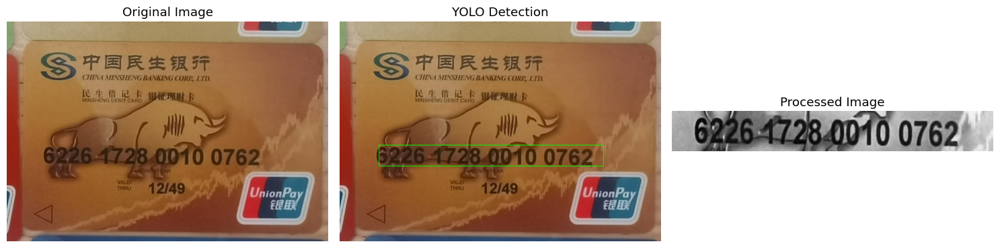

True Label:      6226172800100762
Predicted Label: 6226172800100762
✅ Prediction is correct.



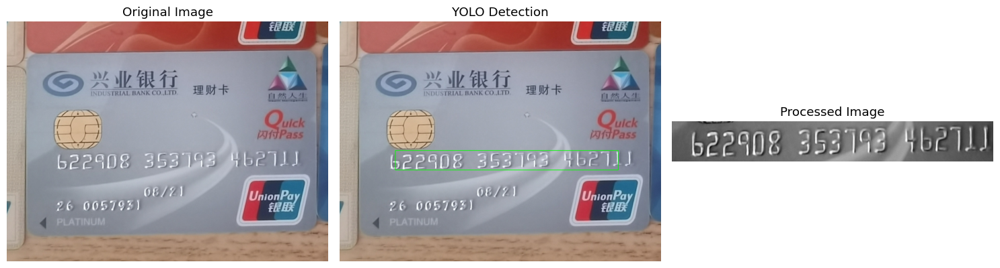

True Label:      622908353793462711
Predicted Label: 622908353793462711
✅ Prediction is correct.



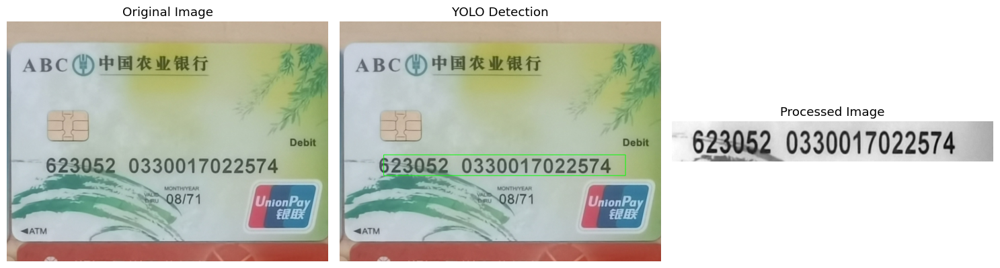

True Label:      6230520330017022574
Predicted Label: 6230520330017022574
✅ Prediction is correct.



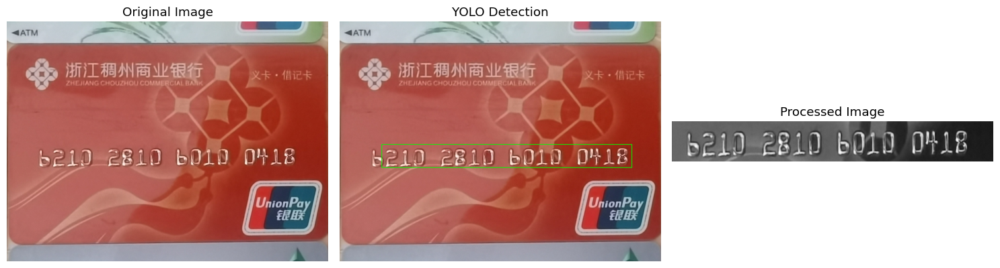

True Label:      6210281060100418
Predicted Label: 6210281060100418
✅ Prediction is correct.



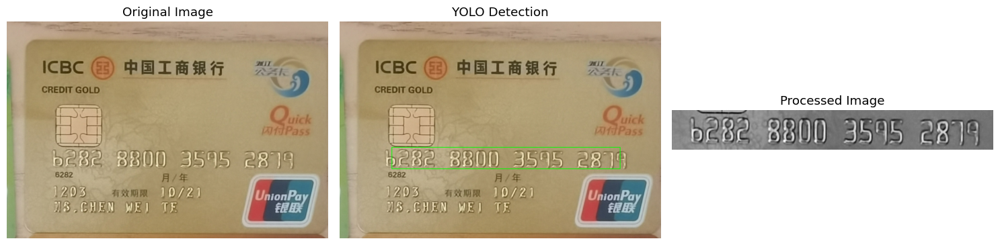

True Label:      6282880035952879
Predicted Label: 6282880035952879
✅ Prediction is correct.



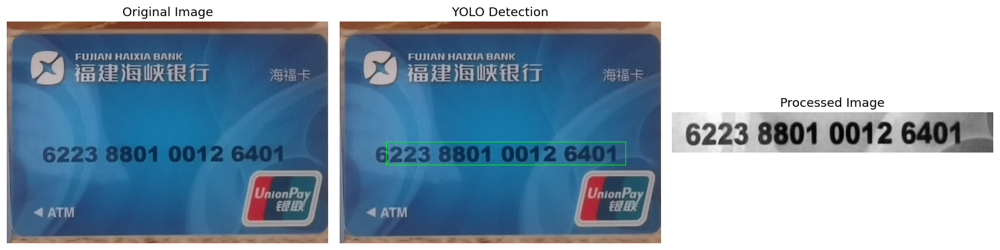

True Label:      6223880100126401
Predicted Label: 6223880100126401
✅ Prediction is correct.



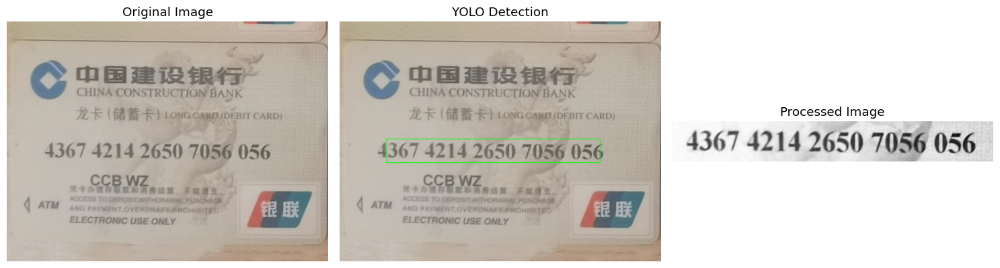

True Label:      4367421426507056056
Predicted Label: 4367421426507056056
✅ Prediction is correct.



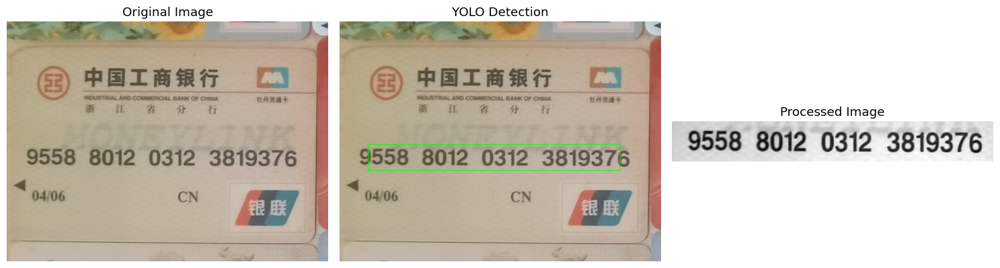

True Label:      9558801203123819376
Predicted Label: 9558801203123819376
✅ Prediction is correct.



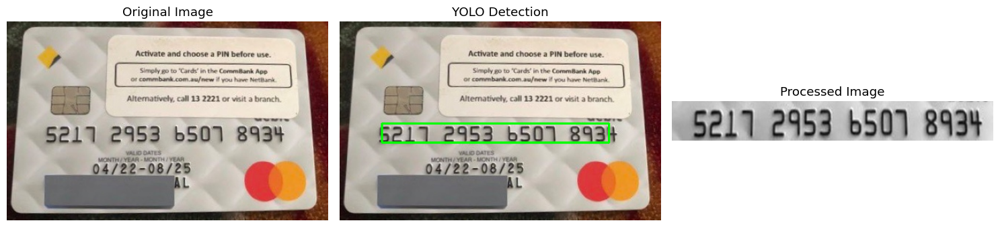

True Label:      5217295365078934
Predicted Label: 5217295365078934
✅ Prediction is correct.



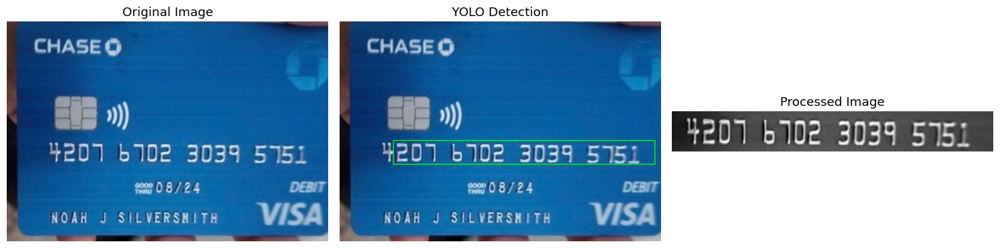

True Label:      4207670230395751
Predicted Label: 4207670230395751
✅ Prediction is correct.



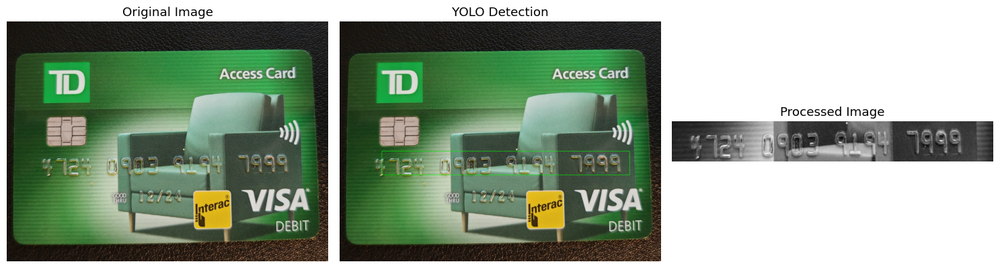

True Label:      4724090391947999
Predicted Label: 4724090391947999
✅ Prediction is correct.



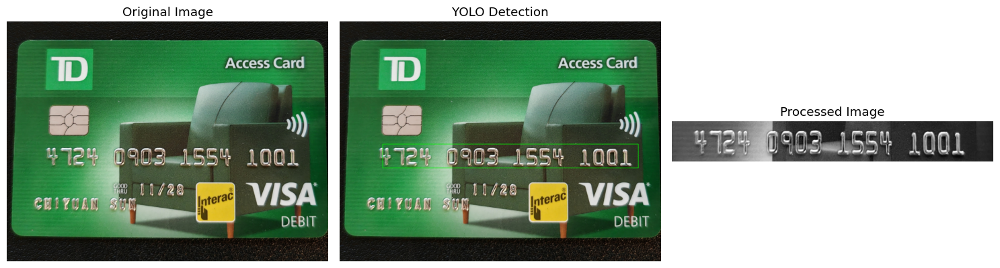

True Label:      4724090315541001
Predicted Label: 4724090315541001
✅ Prediction is correct.



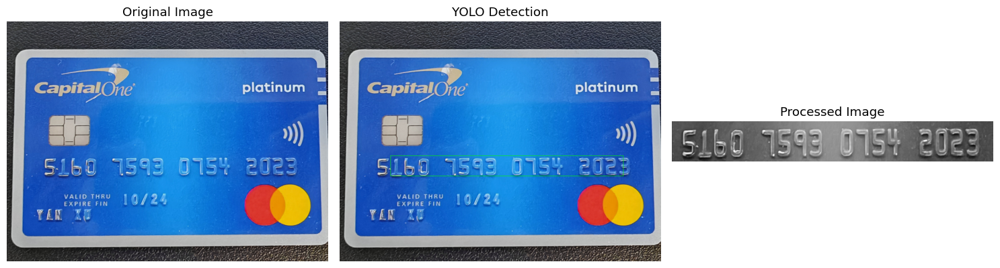

True Label:      5160759307542023
Predicted Label: 5160759307543023
⚠️ Prediction is incorrect!



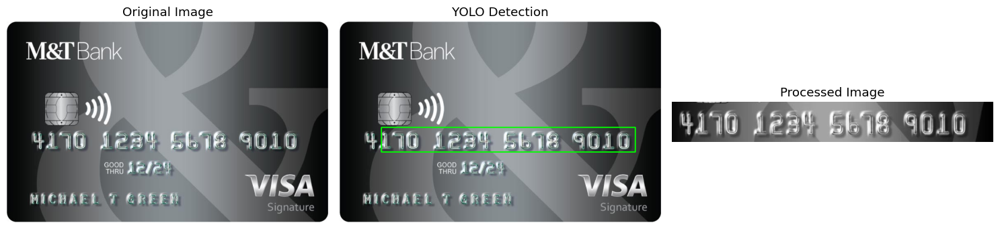

True Label:      4170123456789010
Predicted Label: 4170123456789010
✅ Prediction is correct.



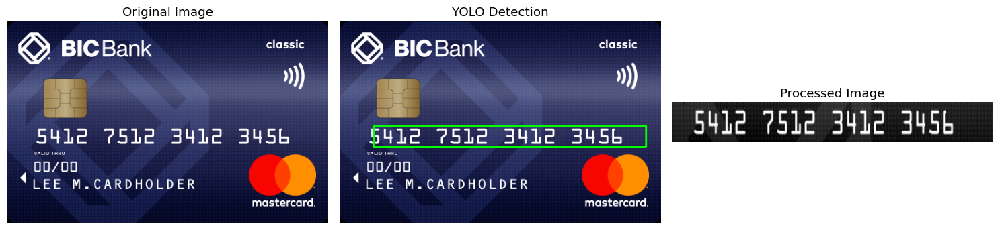

True Label:      5412751234123456
Predicted Label: 5412751234123456
✅ Prediction is correct.



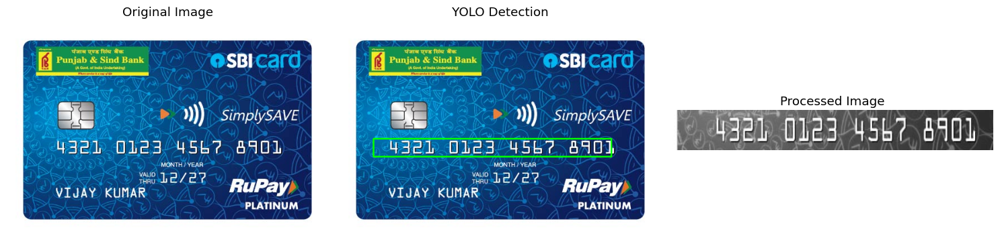

True Label:      4321012345678901
Predicted Label: 4321012345678901
✅ Prediction is correct.



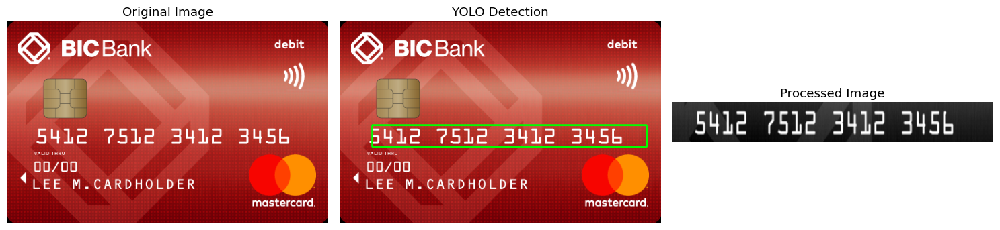

True Label:      5412751234123456
Predicted Label: 5412751234123456
✅ Prediction is correct.



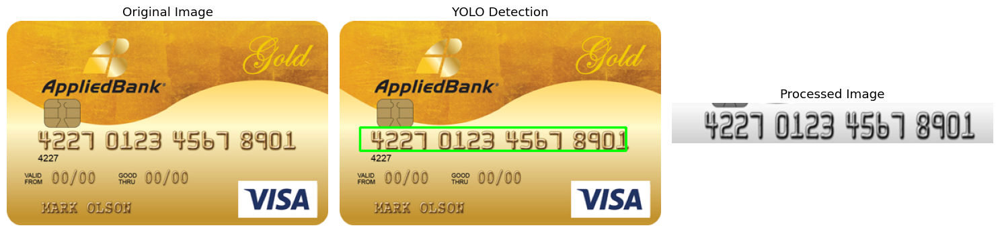

True Label:      4227012345678901
Predicted Label: 4227012345678901
✅ Prediction is correct.



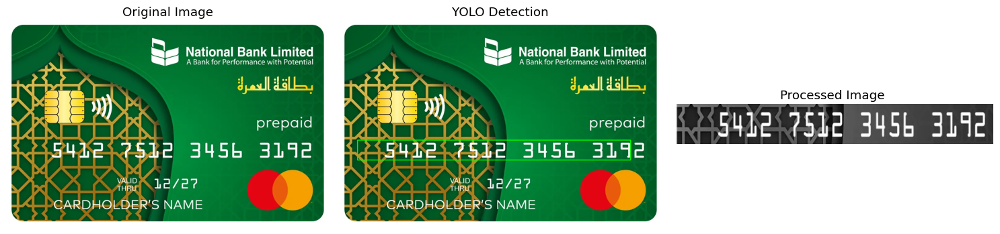

True Label:      5412751234563192
Predicted Label: 5412751234563192
✅ Prediction is correct.



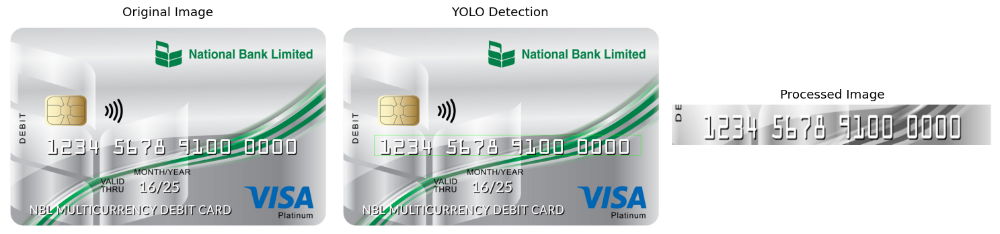

True Label:      123457891000000
Predicted Label: 1234562891000000
⚠️ Prediction is incorrect!



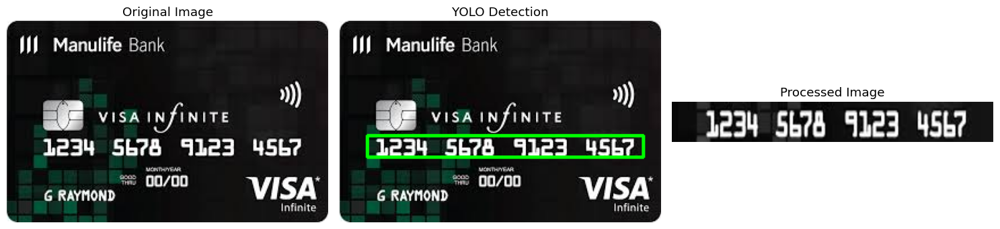

True Label:      1234567891234567
Predicted Label: 123455789123457
⚠️ Prediction is incorrect!



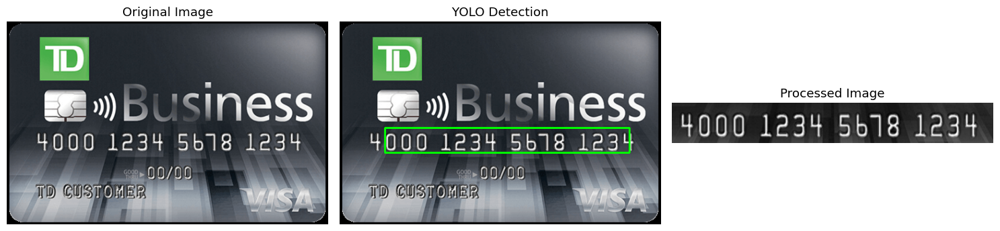

True Label:      4000123456781234
Predicted Label: 4000123456781234
✅ Prediction is correct.



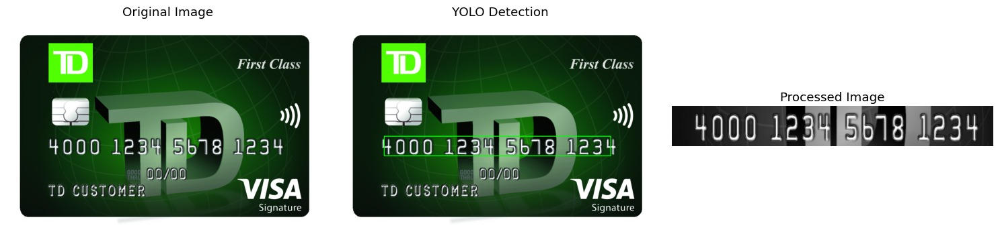

True Label:      4000123456781234
Predicted Label: 4000123456781234
✅ Prediction is correct.



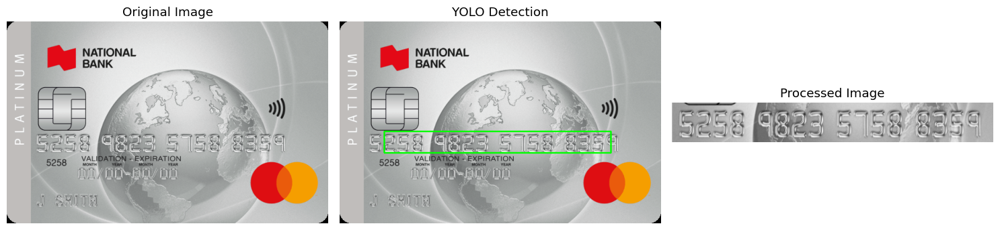

True Label:      5258982357588359
Predicted Label: 525898235758839
⚠️ Prediction is incorrect!



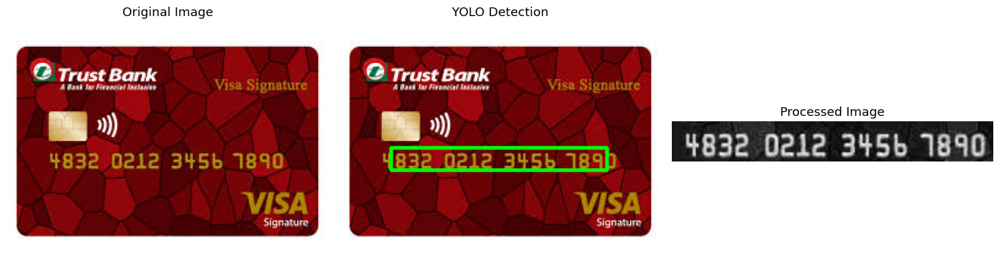

True Label:      4832021234567890
Predicted Label: 4552021234567390
⚠️ Prediction is incorrect!



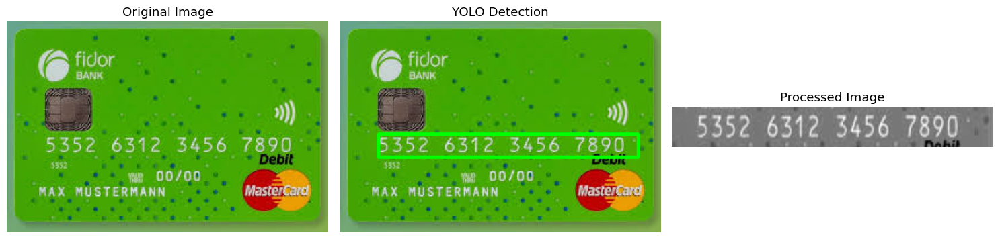

True Label:      5252631234567890
Predicted Label: 535231234567880
⚠️ Prediction is incorrect!



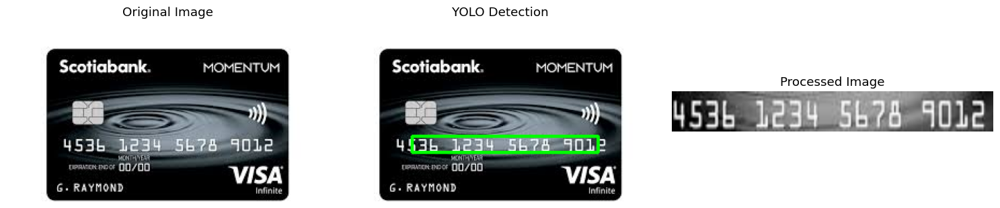

True Label:      4536123456789012
Predicted Label: 4536123456789012
✅ Prediction is correct.



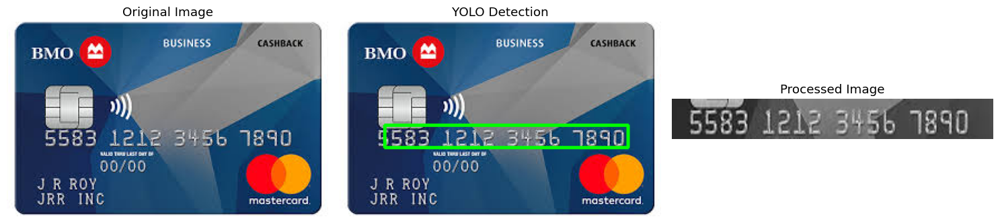

True Label:      5583121234567890
Predicted Label: 5583121234567890
✅ Prediction is correct.



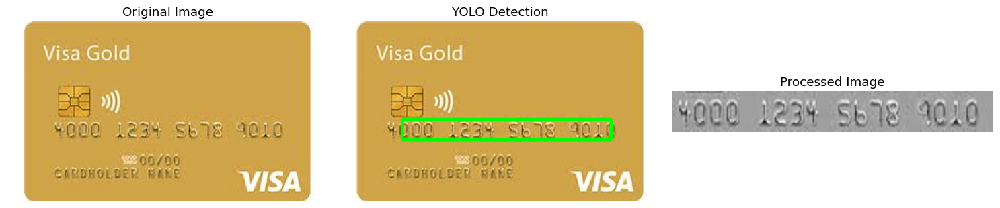

True Label:      4000123456789010
Predicted Label: 40002345678900
⚠️ Prediction is incorrect!



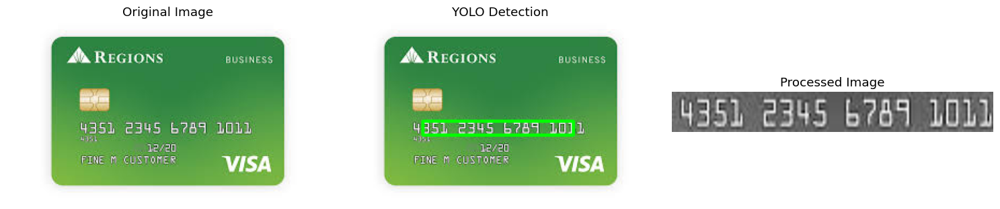

True Label:      4351234567891011
Predicted Label: 4351234567891011
✅ Prediction is correct.



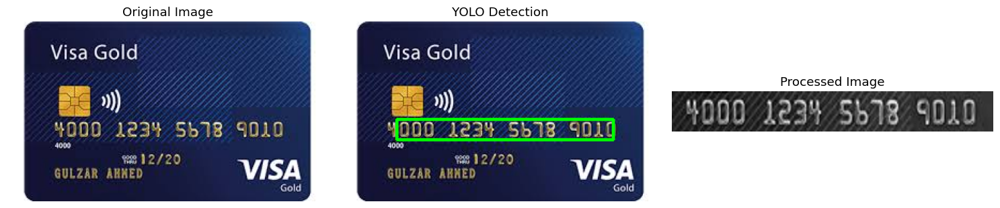

True Label:      4000123456789010
Predicted Label: 400012345789010
⚠️ Prediction is incorrect!



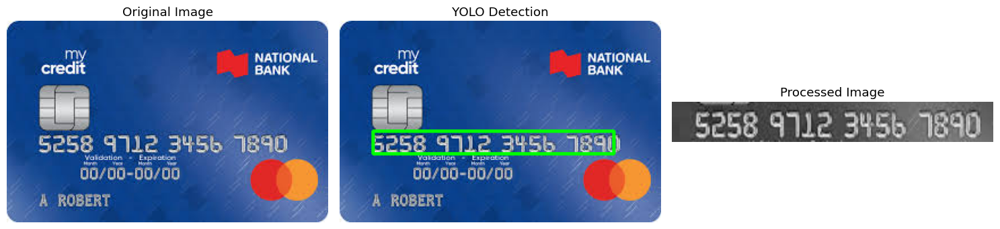

True Label:      5258971234567890
Predicted Label: 5258971234567890
✅ Prediction is correct.


Final Character-Level Accuracy: 91.40%
Final Sequence-Level Accuracy: 75.00%


In [5]:
import matplotlib.pyplot as plt
%matplotlib inline

def visualize_and_evaluate_yolo_results(dataset, model, device):
    """
    Visualize YOLO detection results, processed images, and evaluate predictions.
    Notify for incorrect predictions and calculate accuracy.
    """
    model.eval()
    
    total_chars = 0
    correct_chars = 0
    total_sequences = 0
    correct_sequences = 0

    with torch.no_grad():
        for index in range(len(dataset)):
            
            # Get data
            input_image, label = dataset[index]
            if input_image is None or label is None:
                print(f"Skipping index {index} due to invalid data.")
                continue

            # Prepare input for the model
            input_image = input_image.unsqueeze(0).to(device)  # Add batch dimension
            
            # Forward pass
            outputs = model(input_image)
            outputs = outputs.permute(1, 0, 2)  # Convert to (seq_len, batch, num_classes)
            
            # Decode predictions
            predictions = decode_predictions(outputs)
            predicted_seq = predictions[0]
            
            # Convert label to string for comparison
            label_str = ''.join(map(str, label.tolist()))
            predicted_str = ''.join(map(str, predicted_seq))
            
            # Update accuracy metrics
            total_sequences += 1
            if label_str == predicted_str:
                correct_sequences += 1

            # Character-level accuracy
            min_len = min(len(label_str), len(predicted_str))
            correct_chars += sum(1 for i in range(min_len) if label_str[i] == predicted_str[i])
            total_chars += max(len(label_str), len(predicted_str))
            
            # Visualize the results
            visualize_sample_with_evaluation(dataset, index, label_str, predicted_str)
    
    # Calculate and print final accuracies
    char_accuracy = correct_chars / total_chars if total_chars > 0 else 0
    seq_accuracy = correct_sequences / total_sequences if total_sequences > 0 else 0
    
    print(f"\nFinal Character-Level Accuracy: {char_accuracy * 100:.2f}%")
    print(f"Final Sequence-Level Accuracy: {seq_accuracy * 100:.2f}%")

def visualize_sample_with_evaluation(dataset, index, true_label, predicted_label):
    """
    Visualize the original image, YOLO detection, and processed image.
    Highlight incorrect predictions.
    """
    img_name = dataset.image_filenames[index]
    image_path = os.path.normpath(os.path.join(dataset.image_dir, img_name + '.jpg')).replace("\\", "/")
    
    # Read original image
    original_image = cv2.imread(image_path)
    
    # Get YOLO predictions
    results = dataset.yolo_model(original_image)
    
    # Create a copy for drawing
    detection_image = original_image.copy()
    
    # Draw detection box
    if len(results.xyxy[0]) > 0:
        detection = results.xyxy[0][0]
        x1, y1, x2, y2 = map(int, detection[:4])
        cv2.rectangle(detection_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
    # Convert input tensor to numpy for visualization
    processed_image, _ = dataset[index]
    processed_np = processed_image.squeeze().numpy() if processed_image is not None else None
    
    # Plot
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    
    axes[1].imshow(cv2.cvtColor(detection_image, cv2.COLOR_BGR2RGB))
    axes[1].set_title('YOLO Detection')
    axes[1].axis('off')
    
    if processed_np is not None:
        axes[2].imshow(processed_np, cmap='gray')
        axes[2].set_title('Processed Image')
        axes[2].axis('off')
    else:
        axes[2].set_title('Processed Image Not Available')
        axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print true and predicted labels
    print(f"True Label:      {true_label}")
    print(f"Predicted Label: {predicted_label}")
    if true_label != predicted_label:
        print("⚠️ Prediction is incorrect!\n")
    else:
        print("✅ Prediction is correct.\n")

# Usage Example
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, collate_fn=custom_collate_fn)
crnn_model = CRNN(img_height=64, num_classes=10)
crnn_model.load_state_dict(torch.load("crnn_model_valcharacc92_valseqacc75.pth"))
crnn_model.to(device)

visualize_and_evaluate_yolo_results(test_dataset, crnn_model, device)
